 **Time Series Forecast for Metro Traffic Volume With AWS Sagemaker Deepar Algorithm**


<div>
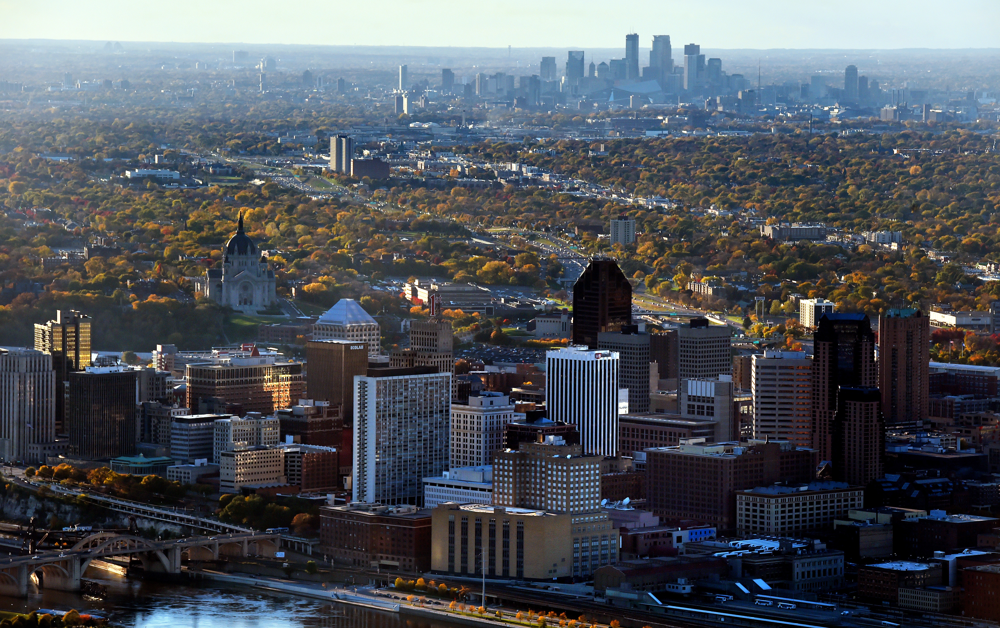
</div>



In this notebook, daily metro traffic volume of 94 Westbound for MN DoT ATR station 301,midway between Minneapolis and St Paul, MN, is going to be predicted by using AWS Sagemaker.This notebook will only include data preprocessing and feature engineering part to upload to the AWS S3 and requesting the predictions via API-Url link which comes from  AWS API Gateway.However entire project covers end to end lifecyle.To sum up briefly:

Getting data (not collection) from http://archive.ics.uci.edu/ml/datasets/Metro+Interstate+Traffic+Volume,

Preparing the data,

Uploading the AWS S3,

Launching training job,

Creating model and Endpoint,

Creating Lambda function,

Creating an API Gateway. 

A few lines of external code will be used to interact with Rest API.

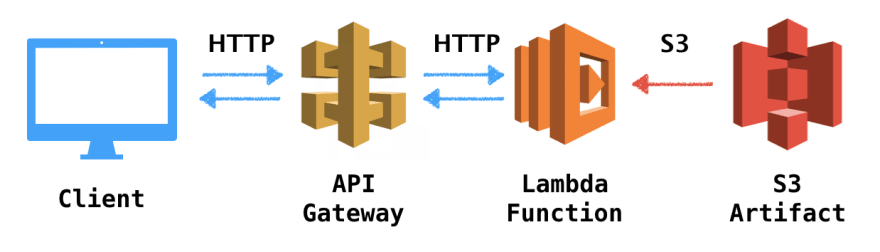



Importing the necessary libraries. 

In [534]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, date 
from datetime import timedelta
from scipy import stats
import requests
import json

<div>
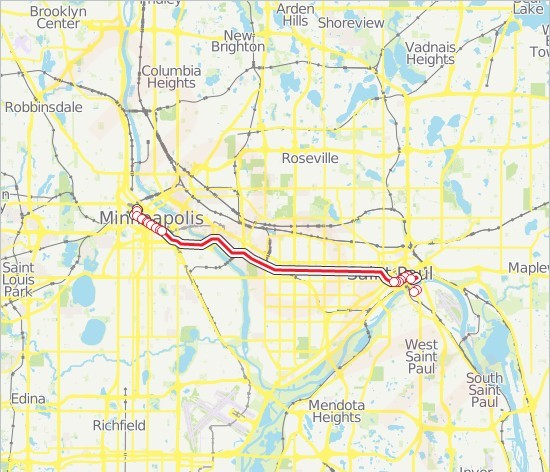
</div>


__Data Set Information__:

Hourly Interstate 94 Westbound traffic volume for MN DoT ATR station 301, roughly midway between Minneapolis and St Paul, MN. Hourly weather features and holidays included for impacts on traffic volume.

__Attribute Information__:

holiday: Categorical US National holidays plus regional holiday, Minnesota State Fair
temp: Numeric Average temp in kelvin
rain_1h: Numeric Amount in mm of rain that occurred in the hour
snow_1h: Numeric Amount in mm of snow that occurred in the hour
clouds_all: Numeric Percentage of cloud cover
weather_main: Categorical Short textual description of the current weather
weather_description: Categorical Longer textual description of the current weather
date_time DateTime: Hour of the data collected in local CST time
traffic_volume: Numeric Hourly I-94 ATR 301 reported westbound traffic volume

In [535]:

df=pd.read_csv('C:\\Users\FURKAN\\Desktop\AWS\\Metro_Interstate_Traffic_Volume\\Metro_Interstate_Traffic_Volume.csv')
df.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


In [536]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48204 entries, 0 to 48203
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   holiday              48204 non-null  object 
 1   temp                 48204 non-null  float64
 2   rain_1h              48204 non-null  float64
 3   snow_1h              48204 non-null  float64
 4   clouds_all           48204 non-null  int64  
 5   weather_main         48204 non-null  object 
 6   weather_description  48204 non-null  object 
 7   date_time            48204 non-null  object 
 8   traffic_volume       48204 non-null  int64  
dtypes: float64(3), int64(2), object(4)
memory usage: 3.3+ MB


The data is consisting of 48204 non-null rows for all features by looking at the table above. First column is holiday feature which has object type of data. Data type should be converted to integer as it will be easier to work on it. 

In [537]:
df.holiday=[1 if i!= 'None' else 0 for i in df.holiday]
df.holiday.value_counts()

0    48143
1       61
Name: holiday, dtype: int64

Date_time's data type is object which needs to be changed to datetime so we can handle with the feature easily. Temperature feature is  Numeric Average in Kelvin. It is also okay to leave it as it is but I prefer the see the values as Celsius.Therefore temperatures values were converted to Celsius type. Dataset should have 1 hour intervals but to be sure, new feature was also added to dataset. Now we can check whether series has constant time intervals or not. 

In [538]:
df.date_time=pd.to_datetime(df.date_time)
df.rename(columns={'date_time':'date'},inplace=True)
df.temp=[float(k-273.15) for k in df.temp]
df['time_interval']=df.date-df.date.shift(1)
df.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date,traffic_volume,time_interval
0,0,15.13,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545,NaT
1,0,16.21,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516,01:00:00
2,0,16.43,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767,01:00:00
3,0,16.98,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026,01:00:00
4,0,17.99,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918,01:00:00


In [539]:
def intervals(df,day=False,hours=False,duplicates=False):
    if day:
       
       interval_list_day=[]
       for i,interval in enumerate(df['time_interval']):
            if i !=0:
               day=interval.days
               if day >=1:   
                   print('interval between two consecutive timestamps: {} days'.format(interval.days))
                   #print('i: ',i)
                   print(df.date[i-1])
                   print(df.date[i])
                   interval_list_day.append(i)
                
       return interval_list_day
    if hours:
         interval_list=[]
         for i,interval in enumerate(df['time_interval']):
            if i !=0:
                hour=interval.seconds/3600
                if hour >=3: #
                    #print('interval between two consecutive timestamps: {} hours'.format(interval.seconds/3600))
                    #print('i: ',i)
                    interval_list.append(i)
         return interval_list
    if duplicates:
            duplicate=[]
            for i,interval in enumerate(df['time_interval']):
                if i !=0:
                    hour=interval.seconds/3600
                    if hour ==0: #
                        #print('interval between two consecutive timestamps: {} hours'.format(interval.seconds/3600))
                        #print('i: ',i)
                        duplicate.append(i)
            return duplicate

intervals(df,day=True)

interval between two consecutive timestamps: 1 days
2013-01-29 00:00:00
2013-01-30 01:00:00
interval between two consecutive timestamps: 1 days
2013-08-31 00:00:00
2013-09-01 23:00:00
interval between two consecutive timestamps: 1 days
2013-09-03 02:00:00
2013-09-04 08:00:00
interval between two consecutive timestamps: 1 days
2013-10-01 23:00:00
2013-10-02 23:00:00
interval between two consecutive timestamps: 10 days
2013-10-27 01:00:00
2013-11-06 04:00:00
interval between two consecutive timestamps: 4 days
2014-04-29 08:00:00
2014-05-04 05:00:00
interval between two consecutive timestamps: 1 days
2014-06-16 09:00:00
2014-06-17 09:00:00
interval between two consecutive timestamps: 2 days
2014-07-27 16:00:00
2014-07-30 09:00:00
interval between two consecutive timestamps: 1 days
2014-08-02 02:00:00
2014-08-03 11:00:00
interval between two consecutive timestamps: 307 days
2014-08-08 01:00:00
2015-06-11 20:00:00
interval between two consecutive timestamps: 1 days
2015-06-12 21:00:00
2015-

[3220,
 8741,
 8768,
 9221,
 9661,
 14012,
 15111,
 15797,
 15865,
 15971,
 15975,
 15978,
 15979,
 15980,
 15982,
 19159]

Data has some missing values.Moreover there are some big gaps between two sequential timestamps. To see clearly, it will be plotted by function below. 

No handles with labels found to put in legend.


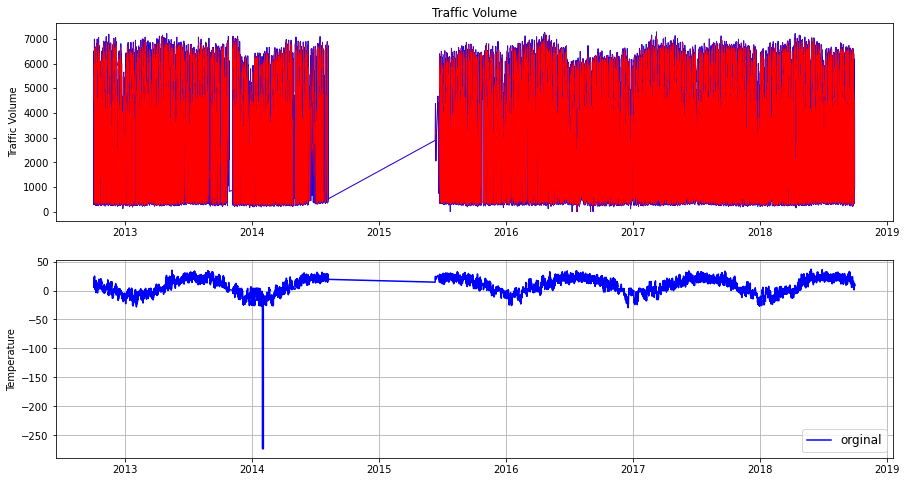

In [540]:
def plot_traffic(df):

    f, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 8))
    old_copy_traffic=df.traffic_volume.copy()
    df['traffic_volume']=np.where((df.traffic_volume==0),np.nan,df.traffic_volume,)
    ax[0].plot(df.date,old_copy_traffic.fillna(np.inf),color='blue',label='orginal',linewidth=1)
    ax[0].plot(df.date,df.traffic_volume.fillna(np.inf),color='red',label='modified',linewidth=0.2)
    
    ax[0].set_title('Traffic Volume')
    ax[0].set_ylabel('Traffic Volume')
    plt.legend(fontsize='large',loc='lower right')

    old_copy_temp=df.temp.copy()
    df['temp']=np.where((df.temp==0),np.nan,df.temp)
    ax[1].plot(df.date,old_copy_temp.fillna(np.inf),color='blue',label='orginal')
    
    ax[1].set_ylabel('Temperature')
    plt.grid()
    plt.legend(fontsize='large',loc='lower right')
    
    plt.show()
plot_traffic(df)

307 days gap shows up itself obviously in the graph although plot it is not great.In this project, only some part of series which is more stable, will be enough for the model. Because 15 days prediction will be made and entire dataset will not be the necessary. That is why, the data between 2016-05-01 01:00:00 and 2018-09-30 23:00:00 will be taken. Additionally, we won't need some other features in our model as we are going to work on daily features (After resampling).So they can be dropped from the dataset. 

In [541]:
df=df[df.date > '2016-05'].reset_index(drop=True)
#df['weather_description']=df.weather_description.astype('category').cat.codes
df.drop(['rain_1h','snow_1h','weather_main','clouds_all','weather_description'],axis=1,inplace=True)
df.set_index('date',inplace=True)
df['date']=df.index
df.head()

,holiday,temp,traffic_volume,time_interval,date
date,,,,,
2016-05-01 01:00:00,0,6.87,946.0,01:00:00,2016-05-01 01:00:00
2016-05-01 02:00:00,0,6.33,735.0,01:00:00,2016-05-01 02:00:00
2016-05-01 03:00:00,0,5.87,395.0,01:00:00,2016-05-01 03:00:00
2016-05-01 04:00:00,0,5.41,390.0,01:00:00,2016-05-01 04:00:00
2016-05-01 05:00:00,0,5.03,629.0,01:00:00,2016-05-01 05:00:00


There might be also duplicate values in the dataset.Therefore they need to be removed.

In [542]:
print(df.date[-1]-df.date[1])
print('Length of index: ',len(df.index))
print('Number of duplicate values: ',len(intervals(df,duplicates=True)))

882 days 21:00:00
Length of index:  25257
Number of duplicate values:  4217


In [543]:
df.drop_duplicates(subset='date',keep='first',inplace=True)
print('Length of index: ',len(df.index))
print('Number of duplicate values: ',len(intervals(df,duplicates=True)))
print('Number of intervals which are >= 1d : {}'.format(len(intervals(df,day=True))))
print('Number of intervals which are >= 3h : {}'.format(len(intervals(df,hours=True))))

Length of index:  21040
Number of duplicate values:  0
Number of intervals which are >= 1d : 0
Number of intervals which are >= 3h : 13


After removing the duplicates, we can see there are no any missing days but there are 13 values which have more than 2 hours intervals.They can be considered as missing values. However in our dataset this can be ignored as they have only %0.061 portion of data. In addition, DeepAR is LSTM based algorithm. LSTM models can cope with missing data quite well. Hence this amount of missing value should not hurt our model performance. 


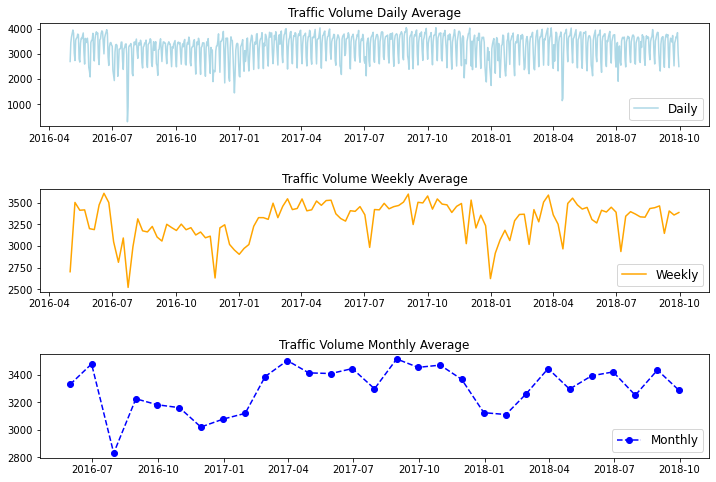

In [557]:
#resampled traffic volumes 

f, ax = plt.subplots(nrows=3, ncols=1, figsize=(12, 8))
f.subplots_adjust(hspace=.6)
ax[0].plot(df.traffic_volume.resample('D').mean(),label='Daily',color='lightblue')  
ax[0].set_title('Traffic Volume Daily Average')
ax[0].legend(fontsize='large',loc='lower right')

ax[1].plot(df.traffic_volume.resample('W').mean(),label='Weekly',color='orange')  
ax[1].set_title('Traffic Volume Weekly Average')
ax[1].legend(fontsize='large',loc='lower right')
    

ax[2].plot(df.traffic_volume.resample('M').mean(),'go--',label='Monthly',color='blue')  
ax[2].set_title('Traffic Volume Monthly Average')
plt.legend(fontsize='large',loc='lower right')


plt.show()

In the plot above, we can see that generally our traffic volume feature does not have trend or seasonality. As the prediction length will be 15 days, the series should be resampled.
There are two types of resampling as upsampling (e.g.days to hours) and downsampling (e.g. days to weeks). In our case, time series will be downsampled. 

In addition to resampling, weekday feature will also be extracted because it could have effect on the the traffic volume. 

In [545]:
#df['date']=df.index
#Downsampling 
resampled_traffic = df[['date','traffic_volume']].resample('D', on='date').sum().reset_index(drop=False )
resampled_holiday=df[['date','holiday']].resample('D',on='date').sum().reset_index(drop=False)
resampled_holiday.rename(columns={'date':'Date'},inplace=True)

resampled_temp=df[['date','temp']].resample('D',on='date').mean().reset_index(drop=False)
resampled_temp.rename(columns={'date':'Date'},inplace=True)

df1=pd.concat([resampled_traffic,resampled_temp,resampled_holiday],axis=1)
df1.drop(['Date'],axis=1,inplace=True)


df1["weekday"]=df1.apply(lambda row: row["date"].weekday(),axis=1)
df1["weekday"] = (df1["weekday"] < 5).astype(int)
df1.set_index('date')

dict_={0:'Weekend',1:'Weekday'}
df1['day'] = df1.weekday.map(dict_)


df1.head()


,date,traffic_volume,temp,holiday,weekday,day
0,2016-05-01,62211.0,10.607391,0,0,Weekend
1,2016-05-02,82915.0,11.594583,0,1,Weekday
2,2016-05-03,88410.0,14.824583,0,1,Weekday
3,2016-05-04,91614.0,12.977083,0,1,Weekday
4,2016-05-05,95033.0,15.141667,0,1,Weekday


No handles with labels found to put in legend.


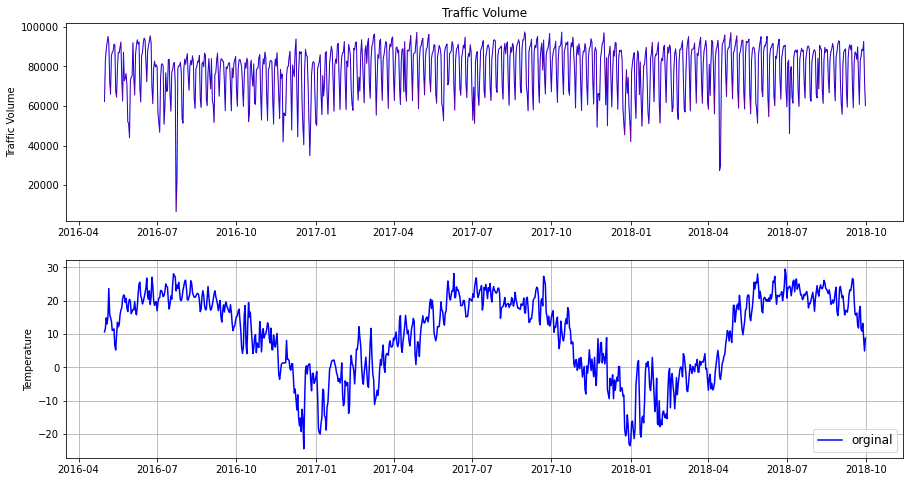

In [546]:
plot_traffic(df1)

No handles with labels found to put in legend.


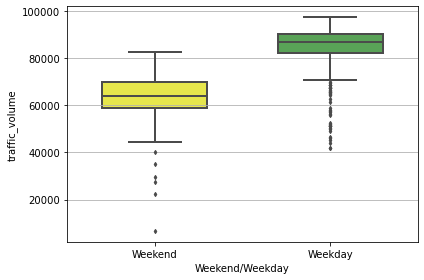

In [547]:


sns.boxplot(x='day',y='traffic_volume',width=0.6,fliersize=3,palette='Set1_r',data=df1,linewidth=2)                                                                                                                                                                                                                                                                                                                                                 
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), shadow=True, ncol=2)
#sns.despine(left=True, bottom=True) 
plt.xlabel('Weekend/Weekday')
plt.tight_layout()                                                                                                                  
plt.legend().set_visible(False)
plt.grid(which='major', axis='y')
plt.show()
df1.drop(['day'],axis=1,inplace=True)


The median of weekday's traffic volume is remarkably higher than weekend one. So there is direct impact of weekend and weekdays to the traffic volume. This feature can be useful in the model. However, we should also have a look into correlations in the data to get better understanding about how the attributes effect each other.

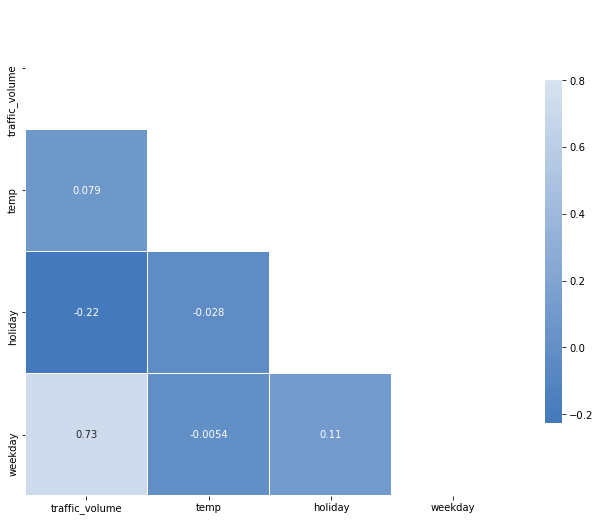

In [548]:
corr=df1.corr()

#sns.heatmap(corr,annot=True)

mask = np.triu(np.ones_like(corr))

f, ax = plt.subplots(figsize=(11, 9))

cmap = sns.diverging_palette(250, 50, as_cmap=True)

sns.heatmap(corr, mask=mask, annot=True,cmap=cmap, vmax=.8, center=1,
            square=True, linewidths=.5, cbar_kws={"shrink": .7})

plt.show()


Heatmap above shows that weekday feature and traffic volume have strong relationship with correlation coefficient of 0.73. Holiday feature has negative correlation with value of -0,22. Temperature is the last attribute which has 0.079 correlation with traffic volume. So we can safely draw the conclusion that weekday feature has strong effect on traffic volume. That is why in our model, firstly we will use weekday values as dynamic feature.


Stationarity

A stationary time series is one whose statistical properties such as mean, variance, autocorrelation, etc. are all constant over time. Most statistical forecasting methods are based on the assumption that the time series can be rendered approximately stationary (i.e., "stationarized") through the use of mathematical transformations. A stationarized series is relatively easy to predict: you simply predict that its statistical properties will be the same in the future as they have been in the past.([For more](https://people.duke.edu/~rnau/411diff.htm))

Some models expect stationary conditions in the time series like ARIMA or some other statistical approaches. In our model, we don't have to check stationarity because LSTM works fundamentally on neural network architecture. However, we can simply assume that it is easier to make some predictions on stationary time series. 

There are several ways of doing stationary check.visually, basic statistics and statistical test (Augmented Dickey Fuller test)



First way, plotting the series and checking visually.


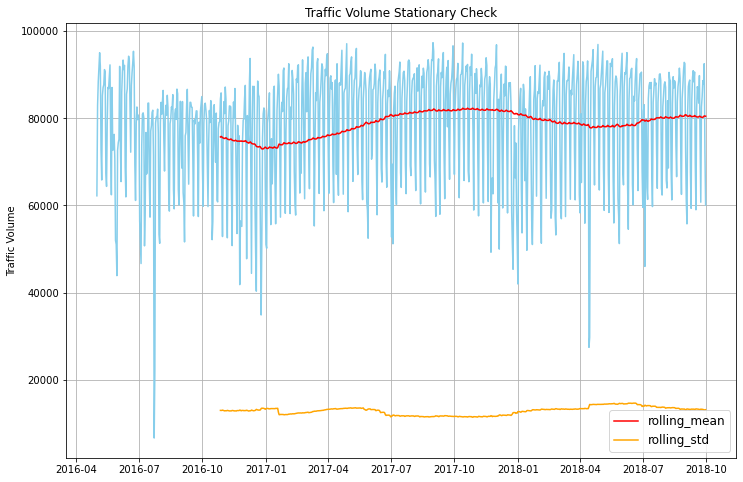

In [558]:
#Checking stationary status visually
rolling_window=180 # for 6 months based rolling window
f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 8))

ax.plot(df1.date,df1.traffic_volume,color='skyblue')
ax.plot(df1.date,df1.traffic_volume.rolling(rolling_window).mean(),color='red',label='rolling_mean')
ax.plot(df1.date,df1.traffic_volume.rolling(rolling_window).std(),color='orange',label='rolling_std')

ax.set_title('Traffic Volume Stationary Check')
ax.set_ylabel('Traffic Volume')
plt.grid()
plt.legend(fontsize='large',loc='lower right')
plt.show()

In the plot, it looks like there is no trend or sesonality as aslo we can see that rolling mean and rollig standart deviation is fairly constant (with 180 days window) inspite of few changes on the rolling mean. However plot didn't deliver certain results to us. Which is why,to ensure, it is good to do statistical test which is Augmented Dickey Fuller test.

Before that, lets look at how our distribution looks like. 

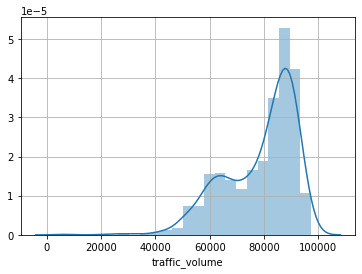

Skewness of normal distribution: -1.0646688605384333
Kurtosis of normal distribution: 1.0794893562348262


In [550]:
sns.distplot(df1.traffic_volume)
plt.grid()
plt.show()
print( 'Skewness of normal distribution: {}'.format(stats.skew(df1.traffic_volume)))
print( 'Kurtosis of normal distribution: {}'.format(stats.kurtosis(df1.traffic_volume)))


Augmented Dickey-Fuller (ADF) test is a type of statistical test called a unit root test. Unit roots are a cause for non-stationarity.
If the time series has unit root, the series will be not-stationary. If the series does not have unit root, then it will be stationary. To see the data's characteristic feature, we will be using Null Hypothesis.

Null Hypothesis (H0): Time series is not stationary.

Alternate Hypothesis (H1): Time series is stationary.

p-value > significance level (default: 0.05): Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
p-value <= significance level (default: 0.05): Reject the null hypothesis (H0), the data does not have a unit root and is stationary.

We will also look at ADF critical values and test statistic as well. 

If test statistic < critical values, we can assume that the time series does not have unit root and reject to Null Hypothesis. If test statisctic > critical values, we will fail to reject the Null Hypothesis which means time series is not stationary and has unit root. 






In [551]:

from statsmodels.tsa.stattools import adfuller

result = adfuller(df1.traffic_volume.values)
adf_stat = result[0]
p_val = result[1]
crit_val_1 = result[4]['1%']
crit_val_5 = result[4]['5%']
crit_val_10 = result[4]['10%']

print('Test Statistic: {}'.format(result[0]),'p-value: {}'.format(result[1]),
'Critical Value_1: {}'.format(result[4]['1%']),'Critical Value_5: {}'.format(result[4]['5%']),
'Critical Value_10: {}'.format(result[4]['10%']),sep='\n')



Test Statistic: -3.7753040734202767
p-value: 0.0031703375775083
Critical Value_1: -3.4379677736185514
Critical Value_5: -2.8649026847264074
Critical Value_10: -2.568560548763626


After ADF test results, the p-value is 0.0031 which is fairly smaller than significance level(0.05) therefore Null Hypothesis can be rejected  as there is no unit root which means time series is stationary. 

Additionally we can also see that all critical values are bigger than test statistic. This also demonstrates time series has no unit root and stationary.

In [559]:
freq='1D' # Frequency will be 1 day 

# Time series was splitted into training and test parts
start_dataset=pd.Timestamp("2016-05-02 00:00:00",freq=freq)  
end_training=pd.Timestamp("2017-09-13 00:00:00",freq=freq)#500
end_testing=pd.Timestamp("2018-06-20 00:00:00",freq=freq) #780


AWS Sagemker DeepAR algorithm expects input values as json format and also gives the predictions in same format as well. The data type was converted to json format before it was uploaded into AWS S3. As many other AWS Sagemaker built-in algortihm, DeepAR aslo assumes that data is stored in S3. For training and test input, we will use start date, target and additioanally dynamic_feat which we firstly use weekday feature. 


In [553]:

from pathlib import Path



if Path("C:\\Users\\FURKAN\\Desktop\\codes\\traffic_volume_train.json").is_file():
    print ("Train file already exist")
else:
    file = open("C:\\Users\\FURKAN\\Desktop\\codes\\traffic_volume_train.json", 'a+')
# One JSON sample per line
#line = "\"start\":\'{}'\,\"target\":{}\,\"cat\":{}".format(start_dataset, df1.iloc[:500,1].tolist(),df1.iloc[:500,4].tolist())
    train_data=json.dumps({
                'start':str(start_dataset),
                'target': df1.iloc[:500,1].tolist(),
                'dynamic_feat':[df1.iloc[:500,4].tolist()]  
            })
    file.write(train_data)
    file.close()
    print('Train file has been created successfully')


if Path("C:\\Users\\FURKAN\\Desktop\\codes\\traffic_volume_test.json").is_file():
    print ("Test file already exist")
else:        
    file = open("C:\\Users\FURKAN\\Desktop\\codes\\traffic_volume_test.json", 'a+')

    test_data=json.dumps({
                'start':str(end_training),
                'target': df1.iloc[500:780,1].tolist(),
                'dynamic_feat':[df1.iloc[500:780,4].tolist()]
            })

    file.write(test_data)
    file.close()
    print('Test file has been created successfully')

if Path("C:\\Users\\FURKAN\\Desktop\\codes\\traffic_volume_samples.json").is_file():
    print ("Samples file already exist")
else:
    file = open("C:\\Users\\FURKAN\\Desktop\\codes\\traffic_volume_samples.json", 'a+')

    line=json.dumps({
                'start':str(end_testing),
                'target': df1.iloc[780:880,1].tolist(),
                'dynamic_feat':[df1.iloc[765:880,4].tolist()]
            })

    file.write(line)
    file.close()
    print('Samples file has been created successfully')

Train file already exist
Test file already exist
Samples file already exist


After preparing data, it was uploaded directly to AWS S3. 

In [554]:
#Sample data was used for predictions. 

sample_data_list={
                'start':str(end_testing),
                'target': df1.iloc[700:880,1].tolist(),
                'dynamic_feat':[df1.iloc[700:880,4].tolist()]
            }

__Hyperparameters For Training Job__

Initial hyperparameters were choosen as below for training job.

context_length : 75  # Length of values which algorithm checks before it start to predict. In this case we define 75 values need to be checked.

dropout_rate : 0.1    # It prevents from overfitting. 

epochs : 100 # Number of epochs for learning proccess. 

embedding_dimension : 10   # Size of embedding vector learned per categorical feature (same value is used for all categorical features).

learning_rate : 0.001 # The learning rate used in training

likelihood : gaussian   # The model generates a probabilistic forecast, and can provide quantiles of the distribution and return samples. Depending on your data, select an appropriate likelihood (noise model) that is used for uncertainty estimates. So firstly we picked Gaussian model.

mini_batch_size : 128  #The size of mini-batches used during training. Default 128

num_cells : 40  #The number of cells to use in each hidden layer of the RNN. Default 40

num_eval_samples : 100 #The number of samples that are used per time-series when calculating test accuracy metrics.

num_layers : 2 #The number of hidden layers in the RNN Default 2 

prediction_length : 15 # Number of values we want to predict

test_quantiles : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9] # Quantiles for which to calculate quantile loss on the test channel.

time_freq : 1D  # The granularity of the time series in the dataset

[For more](https://docs.aws.amazon.com/sagemaker/latest/dg/deepar_hyperparameters.html)



In [555]:
# get_prediction function is for fetching the predictions by interacting with RestAPI.

def get_prediction(data):
    url = 'url from API Gateway'  # There is no url provided in this code because after the project, Enpoint was deleted.
    r = requests.post(url, data=json.dumps(data))
    response = getattr(r,'_content').decode("utf-8")
    #print(response)
    return response


There is one crucial point about dynamic feature. When we provide target samples to the model as input for the __prediction__, we aslo need to provide dynamic feature samples but length of dynamic feature needs to be  len(target samples) + len(prediction_length). That means  if we trained our model with dynamic feature, we have to give additioanal input as length of prediction values. For example, in our case, we are providing 100 target samples to the model for 15 days prediction (for test purpose). For dynamic feature we are providing 115 samples. Basically we are asking to model to predict 15 days and we have to also tell the model what kind of days will thoes 15 days like, are they weekdays or not ? Thus we are providing a list of samples to model(e.g. [0,1,1,1,1,1,0,0,1 ...,]).    

[For more about Input/Output Interface for the DeepAR Algorithm ](https://docs.aws.amazon.com/sagemaker/latest/dg/deepar.html)

In [ ]:
# As evaluation metric RMSE scorce were used. 

prediction_mean = []
prediction_upper = []
prediction_lower = []
all_predictions_rmse=[]

for a in range(0,10):
    test_sample = {}
    test_sample = {"instances": [sample_data_list.copy()]}
    test_sample["instances"][0]["target"] = sample_data_list["target"][a+30:a+130]  # to slide the windows
    test_sample["instances"][0]["dynamic_feat"] = [sample_data_list["dynamic_feat"][0][a+30:a+145]]
    test_sample["configuration"] =  {"output_types": ["mean",
                                                      "quantiles"
                                                     ],
                                     "quantiles": ["0.1",
                                                   "0.9"
                                                  ]
                                    }
    #print(test_sample)
    
    prediction_upper.append(json.loads(get_prediction(test_sample))['body']['predictions'][0]['quantiles']['0.9'])
    prediction_mean.append(json.loads(get_prediction(test_sample))['body']['predictions'][0]['mean'])
    prediction_lower.append(json.loads(get_prediction(test_sample))['body']['predictions'][0]['quantiles']['0.1'])


for i in range(0,10):
         all_predictions_rmse.append(np.sqrt(np.mean(
             (np.array(prediction_mean[i]) - np.array(sample_data_list["target"][a+130:a+145]))**2)))


plt.plot(prediction_mean[9],'go--',label="predictions_mean",color='blue')
#plt.plot(prediction_upper[9], 'go-',label="upper level")
#plt.plot(prediction_lower[9],'go-', label="lower_level")
plt.plot(sample_data_list["target"][139:154], label="true value",color='red')
plt.fill_between(range(0,len(prediction_lower[9])),prediction_lower[9], prediction_upper[9], color='lightgreen', alpha=0.5, label='Confidence Interval')

#plt.axhspan(min(prediction_lower[9]),max(prediction_upper[9]),color="lightgreen",alpha=0.7)
plt.xlabel('Days')
plt.ylabel('Number of Traffic')
plt.title('15 Days Prediction with Dynamic Feature')
plt.ylim([30000,110000])
plt.xlim([0,15])
plt.grid()
plt.legend(loc='lower right')
plt.show()


print('RMSE (9) : ',np.sqrt(np.mean((np.array(prediction_mean[9]) - np.array(sample_data_list["target"][139:154]))**2)))
print('RMSE (low) : ',np.sqrt(np.mean((np.array(prediction_lower[9]) - np.array(sample_data_list["target"][139:154]))**2)))
print('RMSE (upp) : ',np.sqrt(np.mean((np.array(prediction_upper[9]) - np.array(sample_data_list["target"][139:154]))**2)))


plt.plot(all_predictions_rmse,color='orange')
plt.xlabel('Number of slides')
plt.ylabel('RMSE Score')
plt.title('RMSE Scores Per Window with Dynamic Feature')
plt.grid()
plt.show()


<div>
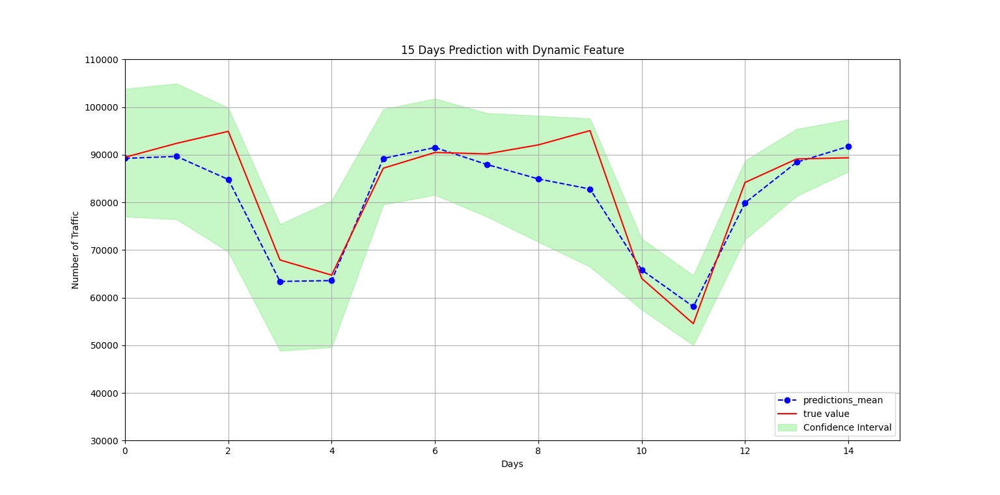
</div>


Prediction results looks like promising. RMSE Score was 5876 but it varies per window slice. 

<div>
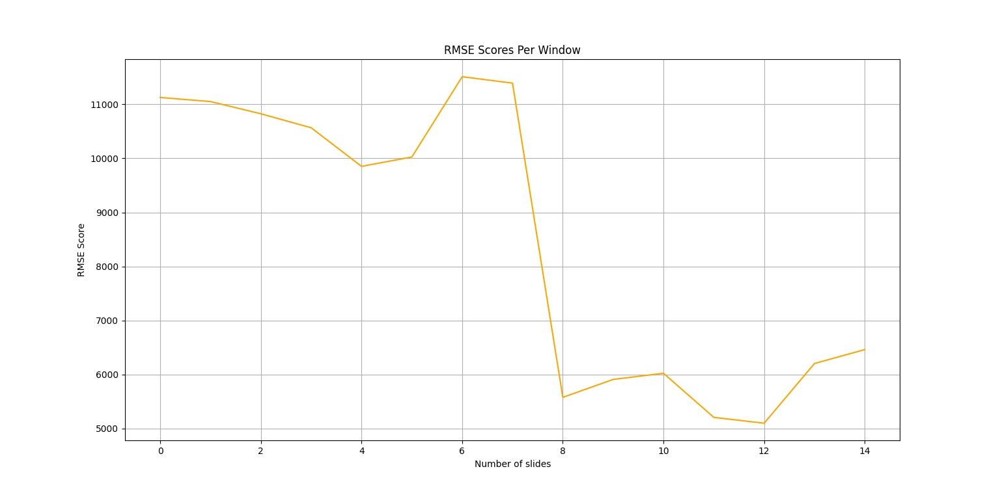
</div>




What if we don't provide dynamic feature to the model?


<div>
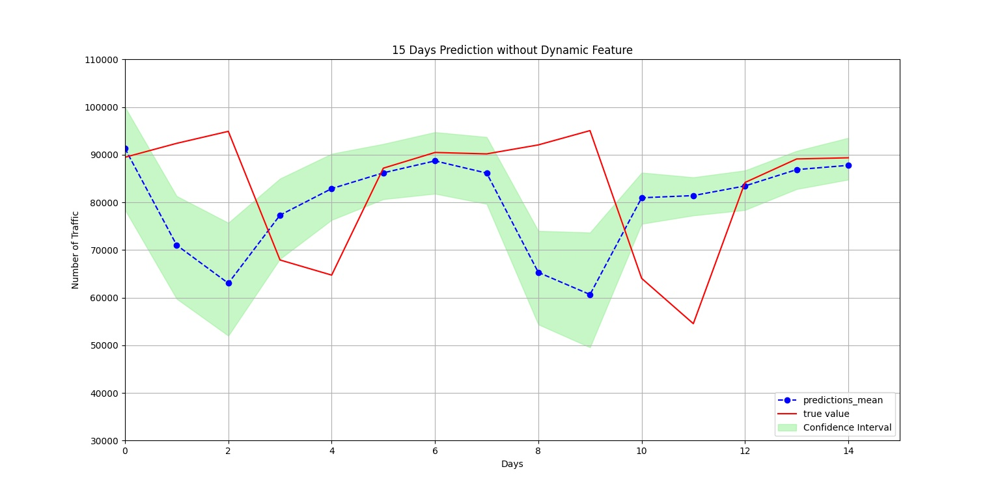
</div>


We can see that if we dont provide dynamic feature, predictions have less accuracy. Particularly, it can be seen that model goes off the points where it needs to be matched. Those points stand for the weekend days. When we train our model with dynamic feature, the algorithm learns the pattern with those additional feature whatever we provide. If we don't give those feautures for prediction, the model will not be able to do accurate foreacasts.
<div>
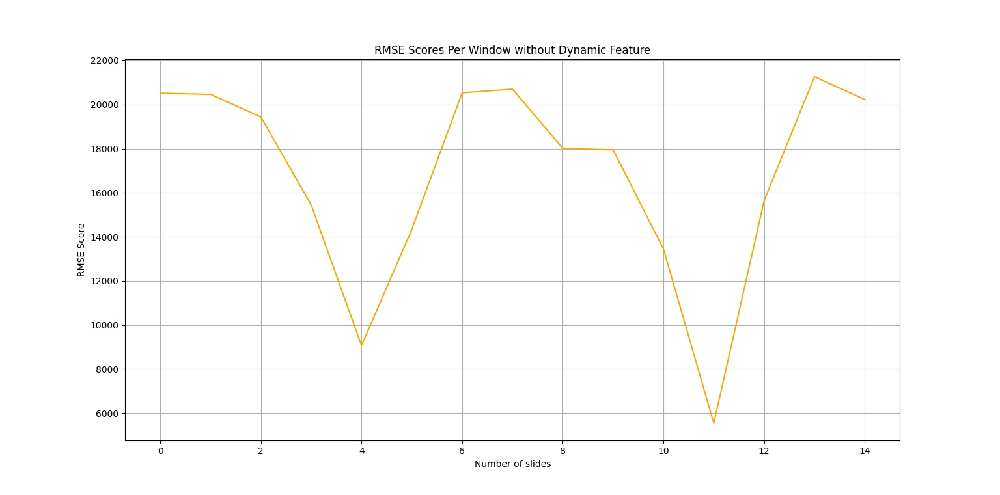
</div>


Now lets try other dynamic feautures as well. 


<div>
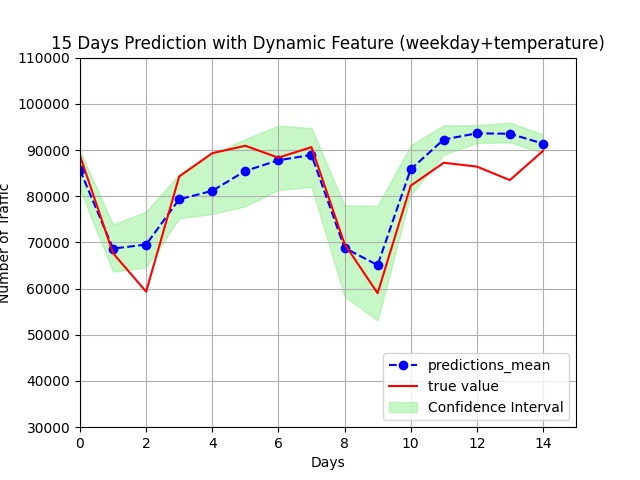
</div>



<div>
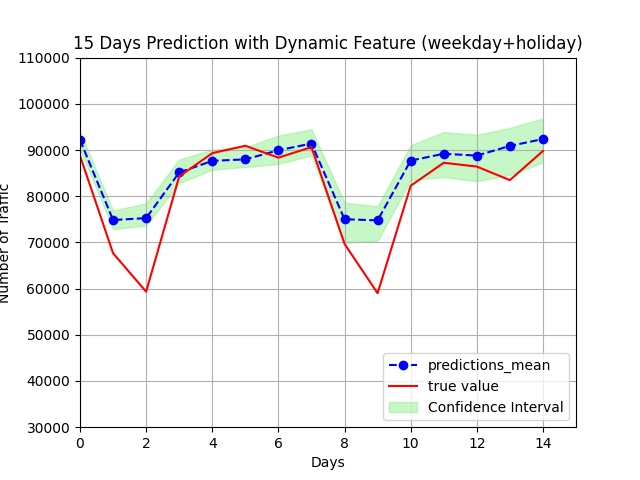
</div>



<div>
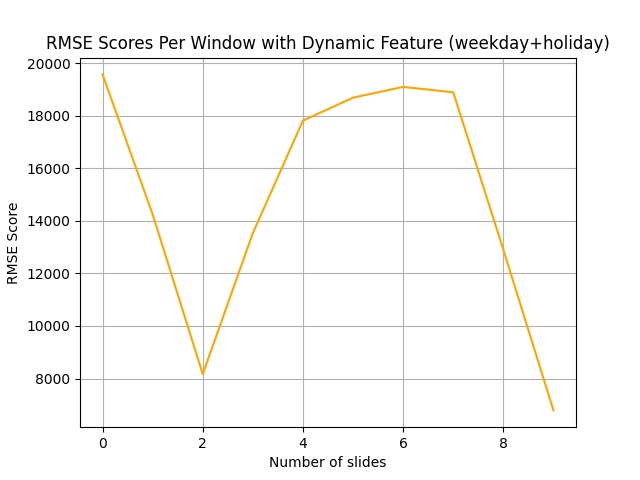
</div>


In this part, we are going to change few hyperparameters to observe outcomes.








With T-Distribution

__Hyperparameters For Training Job__

context_length : 75

dropout_rate : 0.2

embedding_dimension : 10

epochs : 100

learning_rate : 0.001

likelihood : student-t

mini_batch_size : 128

num_cells : 40

num_eval_samples : 100

num_layers : 3

prediction_length : 15

test_quantiles : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

time_freq : 1D


<div>
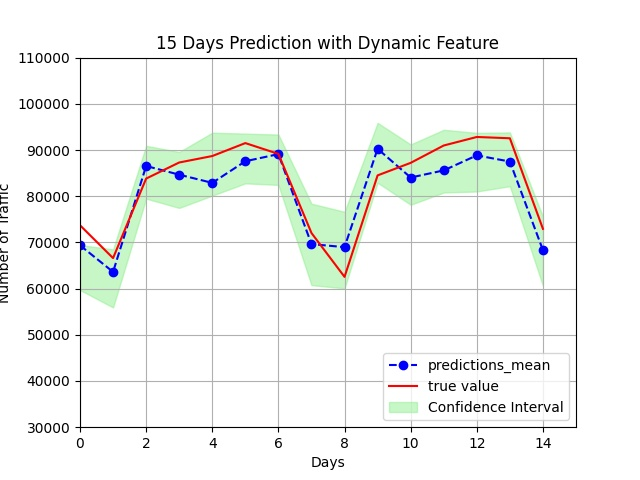
</div>








__Hyperparameters For Training Job__

context_length : 75

dropout_rate : 0.2

embedding_dimension : 10

epochs : 100

learning_rate : 0.001

likelihood : gaussian       #  With Z-Distribution

mini_batch_size : 128

num_cells : 40

num_eval_samples : 100

num_layers : 3

prediction_length : 15

test_quantiles : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

time_freq : 1D

<div>
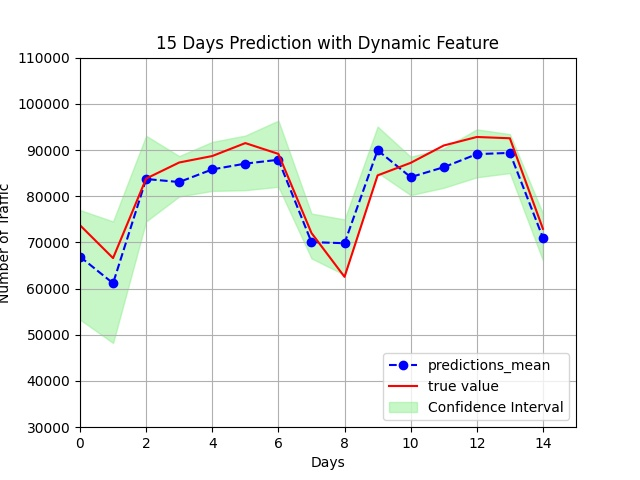
</div>



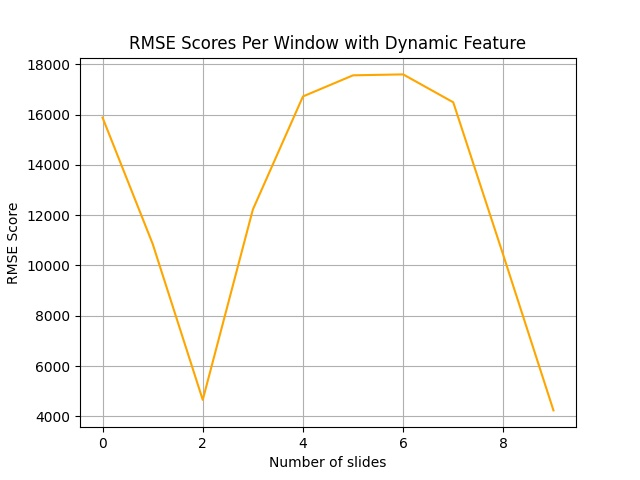

Gaussian model looks like better in our case. 

Having looked at all the results, we could try to tune few more hyperparameters. We can try to do bigger predictions rather than 15 days. But it would be beneficial to have longer evaluation samples. 

__Conclusion__


The project aimed to build full end to end life cycle. In this case there was no deep information about how to create training jobs, endpoints,lambda and API Gateway because it was mainly focused on the other parts. However next project it will be shown how to create them in the jupyter notebook in AWS Sagemaker. 

Please feel free if you have any question or suggestions :)